In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity='all'

! pip install plotly
import plotly.express as px


import warnings
warnings.filterwarnings('ignore')

In [2]:
Cleaned_df=pd.read_csv(r'C:\Cleaned DATA\cleaned data(Final).csv')

In [3]:
Cleaned_df.head()

,Unnamed: 0,Brand,P_name,P_color,MRP,Offer_Percentage,Offer_Price,Rating,Reviews,Performance,RAM,Screen_cm,Screen_inch,Front_Camera,Primary_Camera,Secondary_Camera,Battery_mAh
0,0,APPLE,iPhone 12 Pro Max,Pacific Blue,159900.0,5,150900.0,4.6,57,Excellent,0.0,17.02,6.7,12.0,12,12,4100.0
1,1,APPLE,iPhone 12 Pro Max,Graphite,159900.0,5,150900.0,4.6,57,Excellent,0.0,17.02,6.7,12.0,12,12,4100.0
2,2,APPLE,iPhone 12 Pro Max,Silver,159900.0,5,150900.0,4.6,57,Excellent,0.0,17.02,6.7,12.0,12,12,4100.0
3,3,SAMSUNG,Galaxy Fold 2,Mystic Bronze,189999.0,21,149999.0,3.7,0,Average,12.0,19.30,7.6,0.0,0,0,4500.0
4,4,APPLE,iPhone 12 Pro,Gold,149900.0,6,140900.0,4.5,47,Excellent,0.0,15.49,6.1,12.0,12,12,4100.0


In [4]:
Cleaned_df.shape

(960, 17)

In [5]:
Cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960 entries, 0 to 959
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        960 non-null    int64  
 1   Brand             960 non-null    object 
 2   P_name            960 non-null    object 
 3   P_color           960 non-null    object 
 4   MRP               960 non-null    float64
 5   Offer_Percentage  960 non-null    int64  
 6   Offer_Price       960 non-null    float64
 7   Rating            960 non-null    float64
 8   Reviews           960 non-null    int64  
 9   Performance       960 non-null    object 
 10  RAM               960 non-null    float64
 11  Screen_cm         960 non-null    float64
 12  Screen_inch       960 non-null    float64
 13  Front_Camera      921 non-null    float64
 14  Primary_Camera    960 non-null    int64  
 15  Secondary_Camera  960 non-null    int64  
 16  Battery_mAh       960 non-null    float64
dt

In [6]:
Cleaned_df.columns

Index(['Unnamed: 0', 'Brand', 'P_name', 'P_color', 'MRP', 'Offer_Percentage',
       'Offer_Price', 'Rating', 'Reviews', 'Performance', 'RAM', 'Screen_cm',
       'Screen_inch', 'Front_Camera', 'Primary_Camera', 'Secondary_Camera',
       'Battery_mAh'],
      dtype='object')

In [7]:
Cleaned_df['Front_Camera'] = Cleaned_df['Front_Camera'].fillna(0)

In [8]:
Cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960 entries, 0 to 959
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        960 non-null    int64  
 1   Brand             960 non-null    object 
 2   P_name            960 non-null    object 
 3   P_color           960 non-null    object 
 4   MRP               960 non-null    float64
 5   Offer_Percentage  960 non-null    int64  
 6   Offer_Price       960 non-null    float64
 7   Rating            960 non-null    float64
 8   Reviews           960 non-null    int64  
 9   Performance       960 non-null    object 
 10  RAM               960 non-null    float64
 11  Screen_cm         960 non-null    float64
 12  Screen_inch       960 non-null    float64
 13  Front_Camera      960 non-null    float64
 14  Primary_Camera    960 non-null    int64  
 15  Secondary_Camera  960 non-null    int64  
 16  Battery_mAh       960 non-null    float64
dt

In [9]:
Cleaned_df['Brand'].unique()

array(['APPLE', 'SAMSUNG', 'ViVO', 'OPPO', 'LG', 'HTC', 'Nokia', 'Mi',
       'MOTOROLA', 'ASUS', 'Apple', 'CAT', 'Lenovo', 'Huawei', 'Google',
       'realme', 'Moto', 'POCO', 'Honor', 'Redmi', 'IQOO', 'REDMI',
       'GIONEE', 'Micromax', 'Alcatel', 'Infinix', 'Tecno', 'Motorola',
       'Infocus', 'KARBONN', 'XOLO', 'MI3', 'LEAGOO', 'Panasonic', 'Itel',
       'YU', 'LAVA', 'Nubia'], dtype=object)

In [10]:
# Replacing the Brand name 

In [11]:
Cleaned_df['Brand'] = Cleaned_df['Brand'].replace(['Redmi'],'REDMI')

In [12]:
Cleaned_df['Brand'] = Cleaned_df['Brand'].replace(['Apple'],'APPLE')

In [13]:
Cleaned_df['Brand'] = Cleaned_df['Brand'].replace(['Motorola'],'MOTOROLA')

In [14]:
Cleaned_df['Brand'].unique()

array(['APPLE', 'SAMSUNG', 'ViVO', 'OPPO', 'LG', 'HTC', 'Nokia', 'Mi',
       'MOTOROLA', 'ASUS', 'CAT', 'Lenovo', 'Huawei', 'Google', 'realme',
       'Moto', 'POCO', 'Honor', 'REDMI', 'IQOO', 'GIONEE', 'Micromax',
       'Alcatel', 'Infinix', 'Tecno', 'Infocus', 'KARBONN', 'XOLO', 'MI3',
       'LEAGOO', 'Panasonic', 'Itel', 'YU', 'LAVA', 'Nubia'], dtype=object)

In [15]:
#How many Brands are there

Cleaned_df.Brand.nunique()

35

In [16]:
#Brand name with maximum rating
Cleaned_df.groupby('Brand')['Rating'].max()     # Apple and asus with 4.7

Brand
APPLE        4.7
ASUS         4.7
Alcatel      3.7
CAT          0.0
GIONEE       4.0
Google       4.6
HTC          4.6
Honor        4.4
Huawei       4.5
IQOO         4.4
Infinix      4.4
Infocus      3.9
Itel         3.9
KARBONN      3.3
LAVA         3.9
LEAGOO       4.0
LG           4.4
Lenovo       4.1
MI3          4.4
MOTOROLA     4.2
Mi           4.4
Micromax     4.3
Moto         4.3
Nokia        4.4
Nubia        0.0
OPPO         4.6
POCO         4.5
Panasonic    3.8
REDMI        4.5
SAMSUNG      4.6
Tecno        4.6
ViVO         4.5
XOLO         3.8
YU           3.3
realme       4.6
Name: Rating, dtype: float64

In [17]:
print(Cleaned_df["Brand"][Cleaned_df["Rating"] == Cleaned_df['Rating'].max()].unique())

['APPLE' 'ASUS']


In [18]:
print(Cleaned_df["Brand"][Cleaned_df["Rating"] == Cleaned_df['Rating'].min()].unique())

['CAT' 'ViVO' 'OPPO' 'MOTOROLA' 'realme' 'LG' 'Nubia']


In [19]:
Cleaned_df.groupby('Brand')['Reviews'].max() 

Brand
APPLE        999
ASUS         964
Alcatel       68
CAT            0
GIONEE       436
Google       972
HTC          125
Honor        958
Huawei       269
IQOO         458
Infinix      962
Infocus      416
Itel           2
KARBONN        7
LAVA           0
LEAGOO         4
LG           582
Lenovo       899
MI3          131
MOTOROLA     552
Mi           909
Micromax     459
Moto         515
Nokia        702
Nubia          0
OPPO         975
POCO         727
Panasonic    809
REDMI        970
SAMSUNG      988
Tecno        792
ViVO         957
XOLO         130
YU            21
realme       987
Name: Reviews, dtype: int64

In [20]:
Cleaned_df.rename(columns={  'Unnamed: 0':'Sr No.'},inplace=True)

### Univariate Analysis

### Univariate analysis - analyzing single variable (column)

In [21]:
Cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960 entries, 0 to 959
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Sr No.            960 non-null    int64  
 1   Brand             960 non-null    object 
 2   P_name            960 non-null    object 
 3   P_color           960 non-null    object 
 4   MRP               960 non-null    float64
 5   Offer_Percentage  960 non-null    int64  
 6   Offer_Price       960 non-null    float64
 7   Rating            960 non-null    float64
 8   Reviews           960 non-null    int64  
 9   Performance       960 non-null    object 
 10  RAM               960 non-null    float64
 11  Screen_cm         960 non-null    float64
 12  Screen_inch       960 non-null    float64
 13  Front_Camera      960 non-null    float64
 14  Primary_Camera    960 non-null    int64  
 15  Secondary_Camera  960 non-null    int64  
 16  Battery_mAh       960 non-null    float64
dt

### Analyzing Single Numerical variable

#### Univariate analysis - analyzing single variable (column)

#### 1.Offer_Price

In [22]:
Cleaned_df['Offer_Price'].max()

150900.0

In [23]:
Cleaned_df['Offer_Price'].min()

9799.0

In [24]:
Cleaned_df['Offer_Price'].describe()

count       960.000000
mean      25613.911458
std       24534.952199
min        9799.000000
25%       12499.000000
50%       16244.500000
75%       25600.000000
max      150900.000000
Name: Offer_Price, dtype: float64

In [25]:
Cleaned_df['Offer_Price'].median()

16244.5

In [26]:
import warnings
warnings.filterwarnings('ignore')

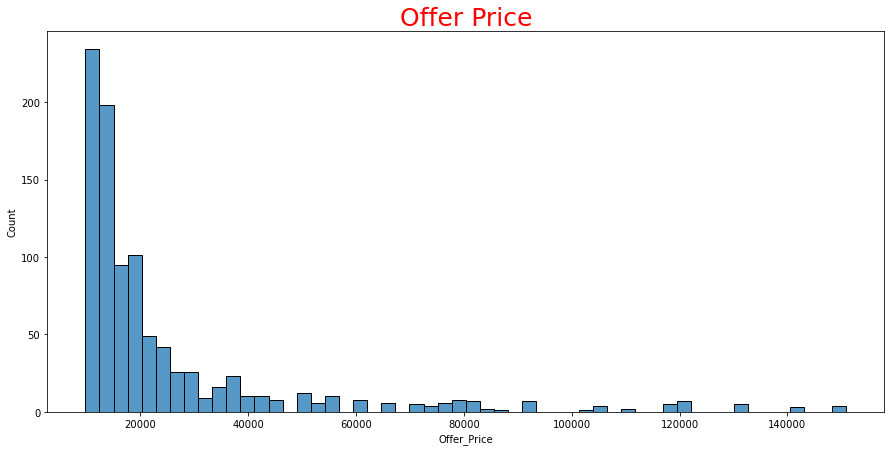

In [27]:
plt.figure(figsize=(15, 7));
sns.histplot(Cleaned_df.Offer_Price)

plt.title('Offer Price',Size=25,color='r');


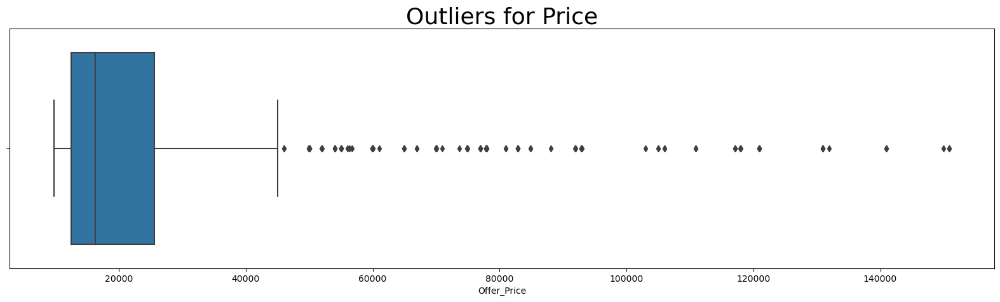

In [28]:
plt.figure(figsize=(20,5), dpi = 100)
sns.boxplot(Cleaned_df['Offer_Price'])
plt.title('Outliers for Price',size=26);


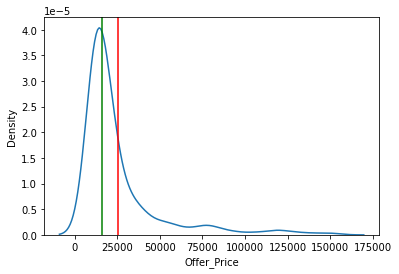

In [29]:
sns.kdeplot(data=Cleaned_df,x='Offer_Price');
plt.axvline(Cleaned_df.Offer_Price.mean(),color='red');
plt.axvline(Cleaned_df.Offer_Price.median(),color='green');

In [30]:
Cleaned_df.Offer_Price.skew()  

2.7696654367016404

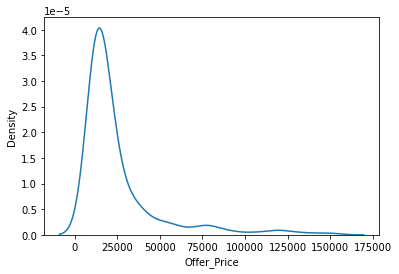

In [31]:
sns.kdeplot(Cleaned_df.Offer_Price);

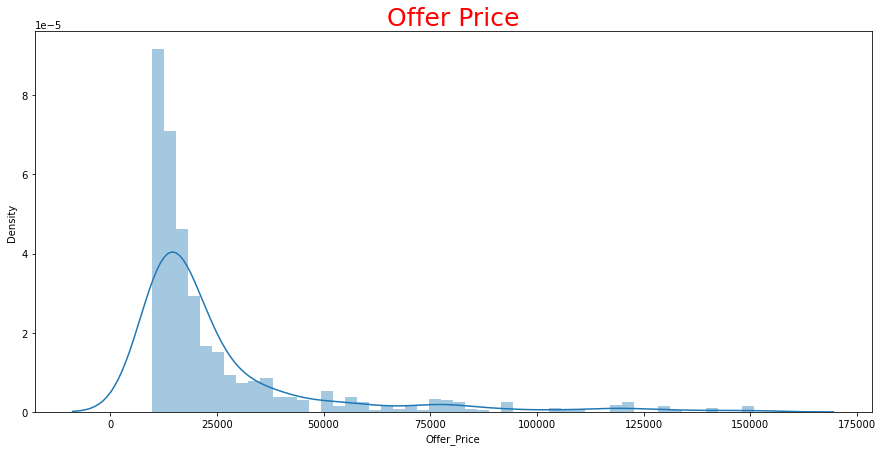

In [32]:
plt.figure(figsize=(15, 7))
ax=sns.distplot(Cleaned_df.Offer_Price)
plt.title('Offer Price',Size=25,color='r');
#ax.set_xlim(9799,175000)


### Observation:
1. We observe that most of the mobiles phones are in range near to 25000
2. We observe that minimum range of mobile is Rs 9799.0.0
3. We observe that maximum range of mobile is Rs 150900.0
4. We observe that outliers is present in Offer_Price column
5. The data is skewed towards right side that is it is positive skewness and highly skewed
6. Mean is right side to the median

#### 2. Ratings

In [33]:
Cleaned_df['Rating'].describe()

count    960.000000
mean       4.245313
std        0.587690
min        0.000000
25%        4.200000
50%        4.300000
75%        4.400000
max        4.700000
Name: Rating, dtype: float64

In [34]:
Cleaned_df['Rating'].min()

0.0

In [35]:
Cleaned_df['Rating'].max()

4.7

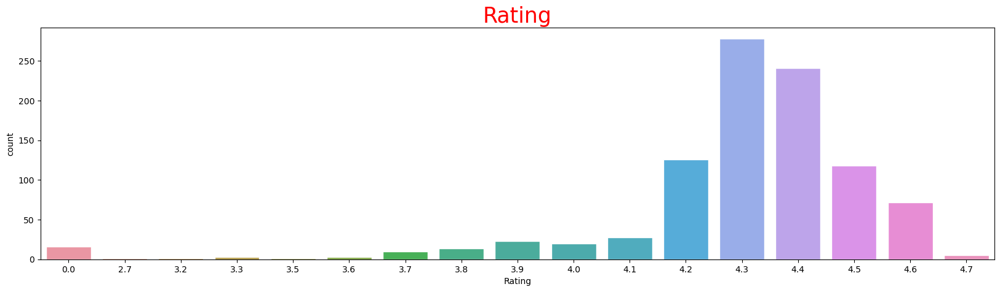

In [36]:
plt.figure(figsize=(20,5), dpi = 100)
sns.countplot(Cleaned_df['Rating'], edgecolor = 'white');

plt.title('Rating',Size=25,color='r');


Observation:

1. Maximum Mobiles in the data got the 4.3 rating
2. Maximum Rating given to the mobile is 4.7
3. Minimum Rating for some mobiles is 2.7
4. Some mobile phones does not have ratings

#### 3. RAM

In [37]:
Cleaned_df['RAM'].min()

0.0

In [38]:
Cleaned_df['RAM'].max()

12.0

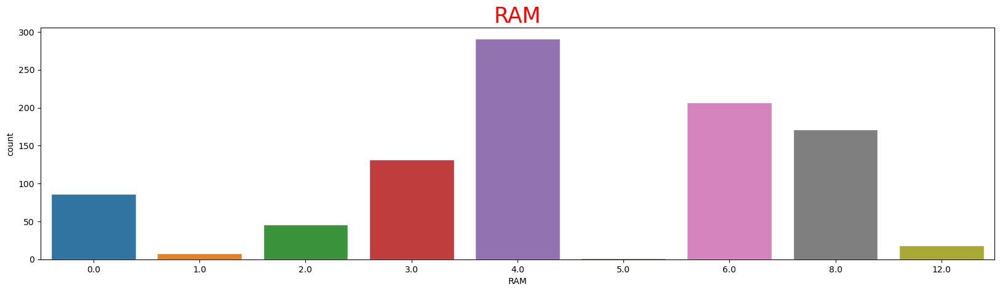

In [39]:
plt.figure(figsize=(20,5), dpi = 100)
sns.countplot(Cleaned_df['RAM'], edgecolor = 'white');
plt.title('RAM',Size=25,color='r');

In [40]:
Cleaned_df['RAM'].describe()

count    960.000000
mean       4.678125
std        2.509531
min        0.000000
25%        3.000000
50%        4.000000
75%        6.000000
max       12.000000
Name: RAM, dtype: float64

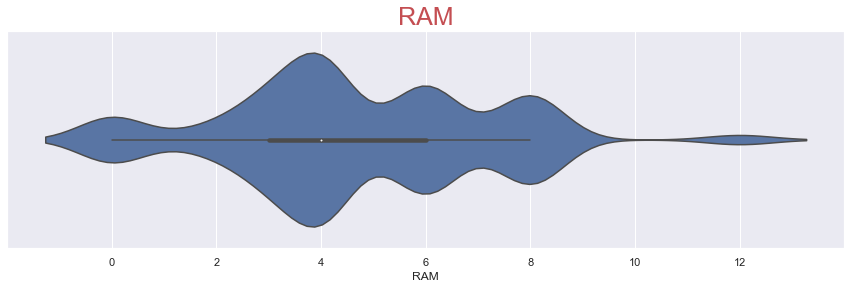

In [42]:
#RAM
sns.set(rc={"figure.figsize" : (15,4)})
sns.violinplot(Cleaned_df.RAM);
plt.title('RAM',Size=25,color='r');

Observation:
1. Maximum Mobiles in the data is of 4 GB RAM 
2. Maximum Range is 12GB of RAM
3. Some Mobiles has not mentioned RAM 


#### 4.Screen_inch

In [41]:
Cleaned_df['Screen_inch'].min()

3.5

In [42]:
Cleaned_df['Screen_inch'].max()

7.6

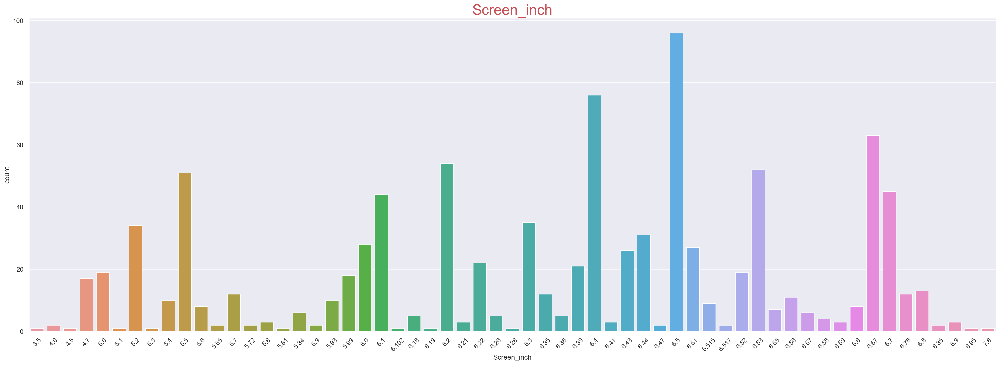

In [43]:
plt.figure(figsize=(30,10), dpi = 200)
sns.countplot(Cleaned_df['Screen_inch'], edgecolor = 'white')
plt.title('Screen_inch',Size=25,color='r')
plt.xticks(rotation=45);


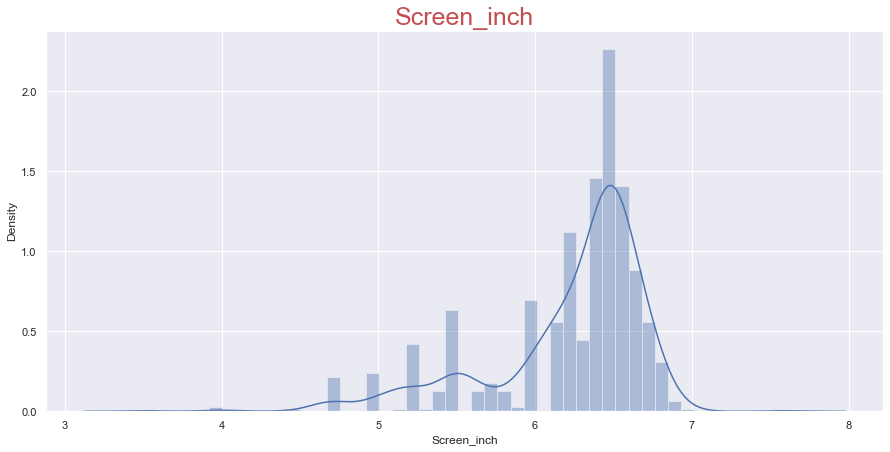

In [44]:
plt.figure(figsize=(15, 7))
sns.distplot(Cleaned_df.Screen_inch)
plt.title('Screen_inch',Size=25,color='r');


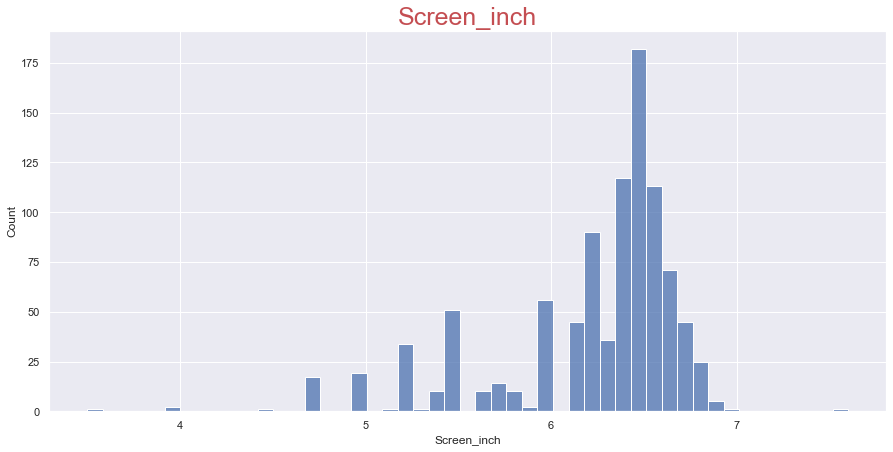

In [45]:
plt.figure(figsize=(15, 7))
sns.histplot(Cleaned_df.Screen_inch)
plt.title('Screen_inch',Size=25,color='r');

Observation:
1. Minimum Screen_inch is 3.5 inches
2. Maximum Screen_inch is 7.6 inches
3. Most of mobiles providing screen between 6 to 7 inches

#### 5 Battery_mAh

In [46]:
Cleaned_df['Battery_mAh'].min()

1200.0

In [47]:
Cleaned_df['Battery_mAh'].max()

7000.0

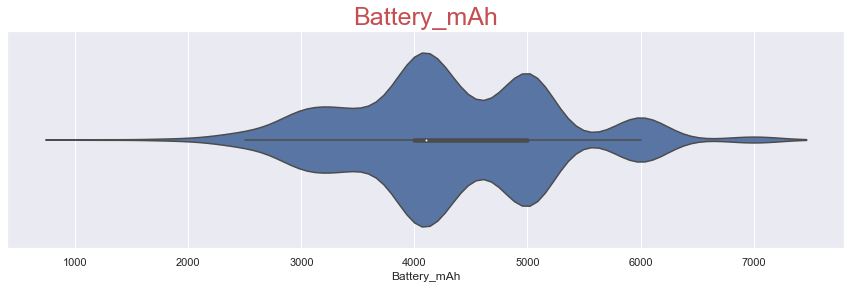

In [48]:
#Battery
sns.set(rc={"figure.figsize" : (15,4)})
sns.violinplot(Cleaned_df.Battery_mAh);
plt.title('Battery_mAh',Size=25,color='r');

In [49]:
Cleaned_df['Battery_mAh'].describe()

count     960.000000
mean     4323.125000
std       915.450068
min      1200.000000
25%      4000.000000
50%      4100.000000
75%      5000.000000
max      7000.000000
Name: Battery_mAh, dtype: float64

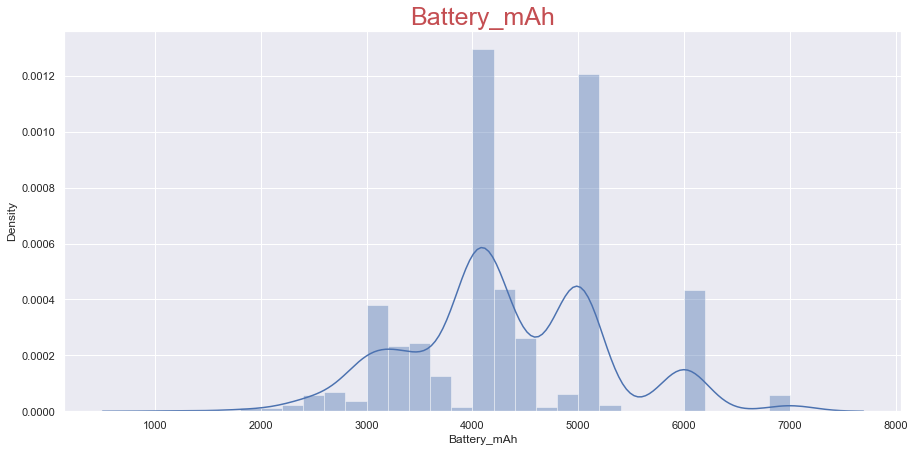

In [50]:
plt.figure(figsize=(15, 7))
sns.distplot(Cleaned_df.Battery_mAh)
plt.title('Battery_mAh',Size=25,color='r');



Observation:
1. Minimum Range for battery is 1200mAh
2. Maximum Range for battery is 7000mAh
3. Some mobiles phones does not included battery capacity in Features

#### 6 Offer_Percentage

In [51]:
Cleaned_df['Offer_Percentage'].max()

63

In [52]:
Cleaned_df['Offer_Percentage'].min()

0

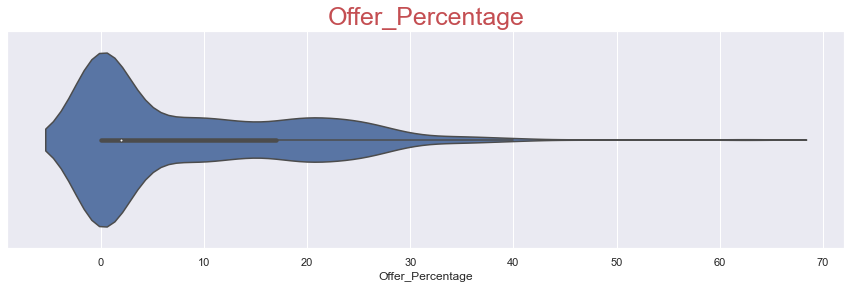

In [53]:
#Offer_Percentage
sns.set(rc={"figure.figsize" : (15,4)})
sns.violinplot(Cleaned_df.Offer_Percentage);
plt.title('Offer_Percentage',Size=25,color='r');

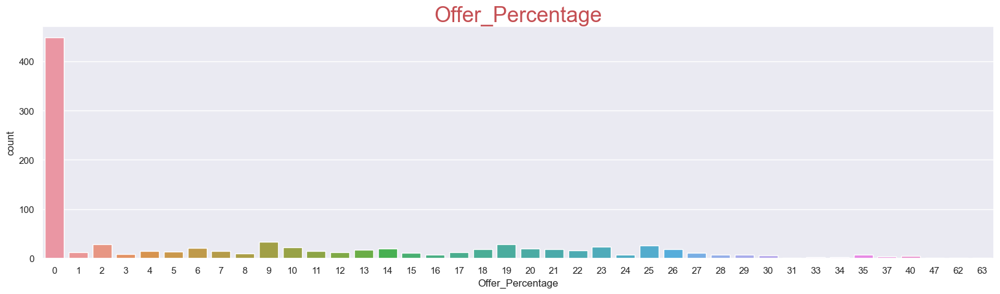

In [54]:
plt.figure(figsize=(20,5), dpi = 100)
sns.countplot(Cleaned_df['Offer_Percentage'], edgecolor = 'white');
plt.title('Offer_Percentage',Size=25,color='r');


In [55]:
Cleaned_df['Offer_Percentage'].describe()

count    960.000000
mean       8.478125
std       10.610535
min        0.000000
25%        0.000000
50%        2.000000
75%       17.000000
max       63.000000
Name: Offer_Percentage, dtype: float64

Observation:
1. Most of the mobiles is not providing offer percentage
2. maximum of 63% offer percentage is given on some mobiles

### Analyzing single variable (column)-Categorical

#### 1.Brand

In [56]:
Cleaned_df['Brand'].describe()

count         960
unique         35
top       SAMSUNG
freq          191
Name: Brand, dtype: object

In [57]:
Cleaned_df['Brand'].unique()

array(['APPLE', 'SAMSUNG', 'ViVO', 'OPPO', 'LG', 'HTC', 'Nokia', 'Mi',
       'MOTOROLA', 'ASUS', 'CAT', 'Lenovo', 'Huawei', 'Google', 'realme',
       'Moto', 'POCO', 'Honor', 'REDMI', 'IQOO', 'GIONEE', 'Micromax',
       'Alcatel', 'Infinix', 'Tecno', 'Infocus', 'KARBONN', 'XOLO', 'MI3',
       'LEAGOO', 'Panasonic', 'Itel', 'YU', 'LAVA', 'Nubia'], dtype=object)

In [58]:
Cleaned_df['Brand'].max()

'realme'

In [59]:
Cleaned_df['Brand'].min()

'APPLE'

In [60]:
import plotly.express as px

In [61]:
px.pie(Cleaned_df,names='Brand',title='Pie Chart for Brands')

<AxesSubplot:ylabel='Brand'>

Text(0.5, 1.0, 'Brands')

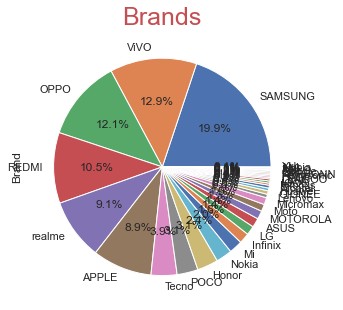

In [62]:
plt.rcParams['figure.figsize']=(20,5)
Cleaned_df['Brand'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Brands',Size=25,color='r')

Observation:
1. Most of mobile phones in the data is of Samsung
2. Top 5 brands avaiable are Samsung,Vivo,Oppo,redmi and Realme



#### 2. Performance

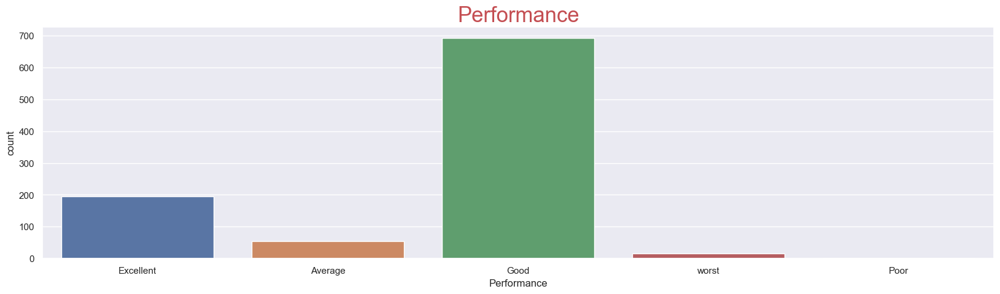

In [63]:
plt.figure(figsize=(20,5), dpi = 100)
sns.countplot(Cleaned_df['Performance'], edgecolor = 'white');""
plt.title('Performance',Size=25,color='r');

Obeservation:
1. Most of the mobiles phones are given based on ratings as Good
2. Performance of Mobile is based on Star-ratings 


### Bivariant Analysis

Cat-numerical

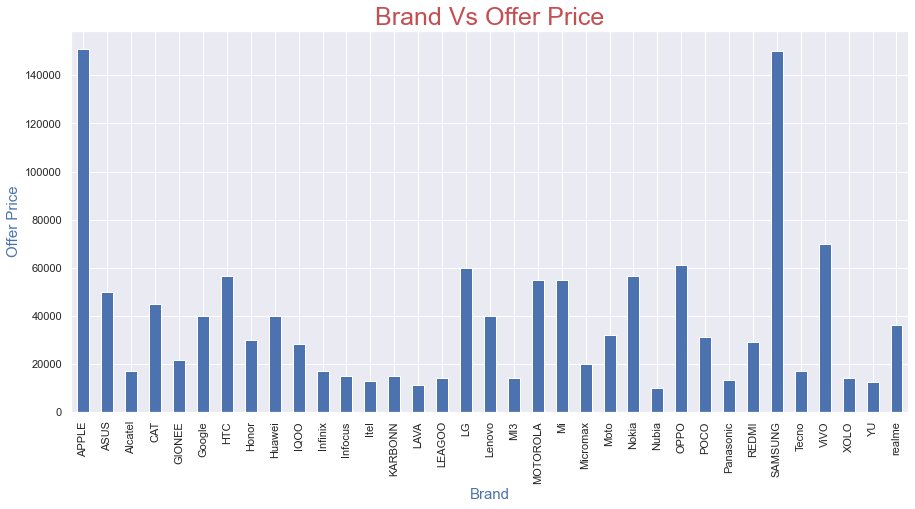

In [64]:
plt.figure(figsize=(15, 7))
Cleaned_df.groupby(['Brand'])['Offer_Price'].max().plot(kind = 'bar')

plt.title('Brand Vs Offer Price',size=25,color='r')
plt.xlabel('Brand',size=15,color='b')
plt.ylabel('Offer Price',size=15,color='b');



In [65]:
px.bar(Cleaned_df,x='Brand',y='Offer_Price',text='Brand',title='Brand Vs Offer Price')

Observation:
1. From all the Brand Apple Mobile phone has highest Price of 150900 Rs
2. Next Brand is Samsung having Price of 149999.0 Rs
3. Vivo Brand having Maximum range of 69990.0Rs
4. Oppo Brand having Maximum range of 60990.0Rs
5. LG Brand having Maximum range of 60000.0 Rs


In [66]:
Cleaned_df.groupby(['Brand']).agg({'Offer_Price' : ['min', 'max']})

Offer_Price          
                  min       max
Brand                          
APPLE         29999.0  150900.0
ASUS          12999.0   49999.0
Alcatel        9999.0   16999.0
CAT           28000.0   44900.0
GIONEE         9999.0   21499.0
Google        26999.0   39999.0
HTC           53990.0   56690.0
Honor         10499.0   30000.0
Huawei        21999.0   39999.0
IQOO          24990.0   27990.0
Infinix        9999.0   16999.0
Infocus        9999.0   14998.0
Itel          12933.0   12933.0
KARBONN       13298.0   14990.0
LAVA          10499.0   10999.0
LEAGOO        10999.0   13999.0
LG            10499.0   60000.0
Lenovo         9999.0   39999.0
MI3           13999.0   13999.0
MOTOROLA      10999.0   54999.0
Mi            14999.0   54999.0
Micromax       9999.0   19999.0
Moto          10999.0   31999.0
Nokia          9799.0   56299.0
Nubia          9999.0    9999.0
OPPO           9940.0   60990.0
POCO          10499.0   30999.0
Panasonic     10999.0   13000.0
REDMI          9969.0   28999.0
SAMSUNG        9840.0  149999.0
Tecno          9999.0   16990.0
ViVO           9811.0   69990.0
XOLO          14153.0   14153.0
YU            12299.0   12299.0
realme         9990.0   35999.0

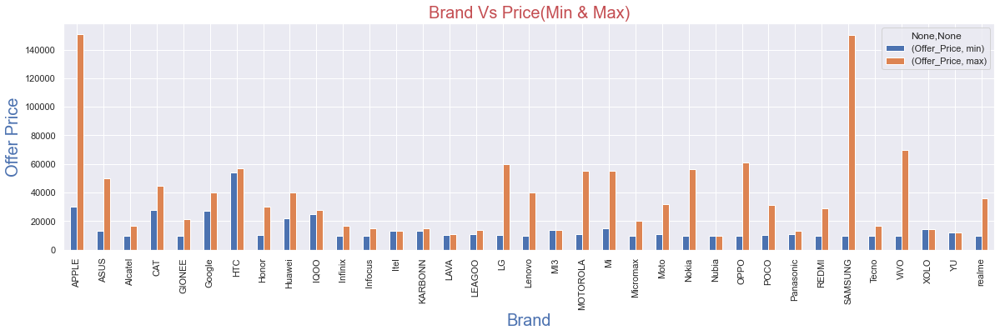

In [67]:
plt.rcParams['figure.figsize']=(20,5)
Cleaned_df.groupby(['Brand']).agg({'Offer_Price' : ['min', 'max']}).plot.bar()

plt.title('Brand Vs Price(Min & Max)',size=20,color='r')
plt.xlabel('Brand',size=20,color='b')
plt.ylabel('Offer Price',size=20,color='b');



Observation:
1. Apple Brand having maximum Price of 150900.0 and minumum range of 29999.0 Rs
2. Asus Brand having Maximum Price of  49999.0	and minumum range of  12999.0 Rs
3. Nokia Brand having maximum Price 9799 and minimum range 56299.0


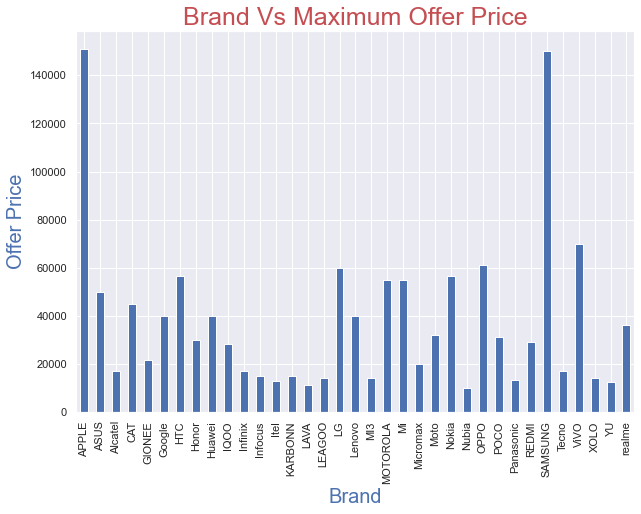

In [68]:
plt.figure(figsize=(10, 7))
Cleaned_df.groupby(['Brand'])['Offer_Price'].max().plot(kind = 'bar')

plt.title('Brand Vs Maximum Offer Price',size=25,color='r')
plt.xlabel('Brand',size=20,color='b')
plt.ylabel('Offer Price',size=20,color='b');


Observation:
1. Top 10 Brand having Maximum Price are Apple,Samsung,Vivo,Oppo,LG,HTC,Motorola,MI,Asus,CAT starting from 150900.0 to 44900.0 Rs


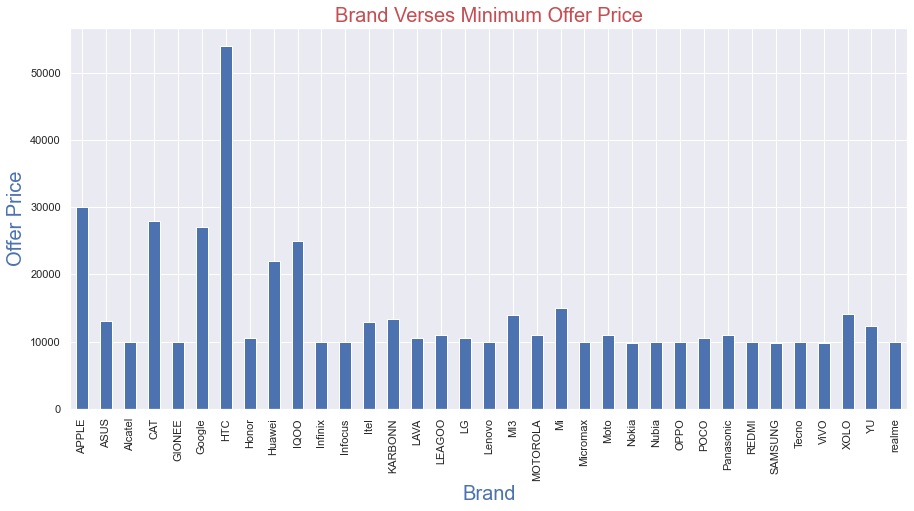

In [69]:
plt.figure(figsize=(15, 7))
Cleaned_df.groupby('Brand')['Offer_Price'].min().plot(kind = 'bar')

plt.title('Brand Verses Minimum Offer Price',size=20,color='r')
plt.xlabel('Brand',size=20,color='b')
plt.ylabel('Offer Price',size=20,color='b');

Observation:
1. Brand Htc Mobile having  Minimum Price of Rs 53990.0
2. Apple Mobile Minimum Pice of Rs 29999.0
3. CAT Mobile having Minimum Price of 28000.0 Rs


In [70]:
Cleaned_df.Offer_Price.describe()

count       960.000000
mean      25613.911458
std       24534.952199
min        9799.000000
25%       12499.000000
50%       16244.500000
75%       25600.000000
max      150900.000000
Name: Offer_Price, dtype: float64

##### Low Range Mobile Phones with Price Less than 10,000

In [71]:
p1 = Cleaned_df[Cleaned_df.Offer_Price<= 10000.0]
px.scatter(p1,x='Brand',y = 'Offer_Price',title='Price Less than 10,000/-')

##### Mobile Phone with Range of 10,000 to 20,000

In [72]:
ab1 = Cleaned_df[(Cleaned_df.Offer_Price >= 10001.0) & (Cleaned_df.Offer_Price <= 20000.0)]
px.scatter(ab1,x='Brand',y = 'Offer_Price',title='Price Between  10,000/-to 20,000/-')

##### Mobile Phone with Range of 20,000 to 40,000

In [73]:
ab2 = Cleaned_df[(Cleaned_df.Offer_Price >= 20001.0) & (Cleaned_df.Offer_Price <= 40000.0)]
px.scatter(ab2,x='Brand',y = 'Offer_Price',title='Price Between 20,000/-to 40,000/-')

##### Mobile Phone with Range of 40,000 to 60,000

In [74]:
ab3 = Cleaned_df[(Cleaned_df.Offer_Price >= 40001.0) & (Cleaned_df.Offer_Price <= 60000.0)]
px.scatter(ab3,x='Brand',y = 'Offer_Price',title='Price Between  40,000/-to 60,000/-')

##### Mobile Phone with Range of 60,000 to 80,000

In [75]:
ab4 = Cleaned_df[(Cleaned_df.Offer_Price >= 60001.0) & (Cleaned_df.Offer_Price <= 80000.0)]
px.scatter(ab4,x='Brand',y = 'Offer_Price',title='Price Between  60,000/-to 80,000/-')

##### Mobile Phone with Range of 80,000 to 100,000

In [76]:
ab5 = Cleaned_df[(Cleaned_df.Offer_Price >= 80001.0) & (Cleaned_df.Offer_Price <= 100000.0)]
px.scatter(ab5,x='Brand',y = 'Offer_Price',title='Price Between  80,000/-to 100,000/-')

##### Mobile Phone with Range of 100,000 to 160,000 Price

In [77]:
ab6 = Cleaned_df[(Cleaned_df.Offer_Price >= 100001.0) & (Cleaned_df.Offer_Price <= 160000.0)]
px.scatter(ab6,x='Brand',y = 'Offer_Price',title='Price Range of Mobiles between 1,00000 to 160000')

In [78]:
Cleaned_df.groupby("Brand")["Offer_Percentage"].max()

Brand
APPLE        29
ASUS         25
Alcatel       0
CAT           0
GIONEE        0
Google       15
HTC           0
Honor         1
Huawei        2
IQOO         34
Infinix      26
Infocus      23
Itel          0
KARBONN       0
LAVA          1
LEAGOO       21
LG           62
Lenovo        0
MI3           0
MOTOROLA     63
Mi           20
Micromax     33
Moto         16
Nokia        16
Nubia         0
OPPO         27
POCO         30
Panasonic     0
REDMI        28
SAMSUNG      40
Tecno        21
ViVO         28
XOLO          0
YU           12
realme       40
Name: Offer_Percentage, dtype: int64

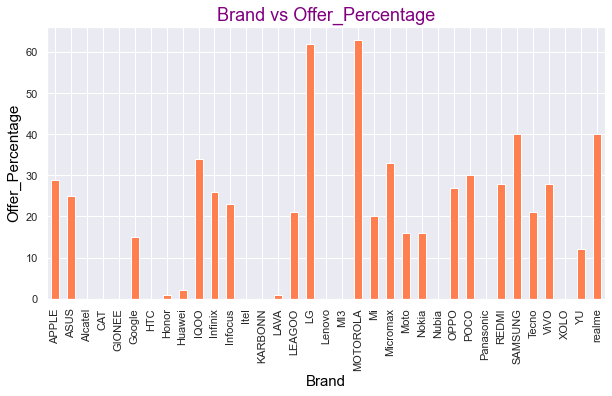

In [79]:
plt.figure(figsize = (10,5))
Cleaned_df.groupby("Brand")["Offer_Percentage"].max().plot(kind = "bar",color="coral")
plt.title("Brand vs Offer_Percentage",size=18,color = "purple")
plt.xlabel("Brand",color = "black",size=15)
plt.ylabel("Offer_Percentage",color = "black",size=15);

Observation:
1. Brand Alcatel,CAT,Gionee,Htc,Itel,Karbonn,Lenevo,Mi3,Nubia ,Panasonic ,Xolo are not providing with Offer percentage 
2. Brand Motorola and LG givinh more offer percentage of 63 and 62 Percentage

In [80]:
Cleaned_df.groupby('Brand')[['Rating']].min()

,Rating
Brand,
APPLE,4.5
ASUS,3.9
Alcatel,3.6
CAT,0.0
GIONEE,2.7
Google,4.5
HTC,4.2
Honor,3.9
Huawei,4.3


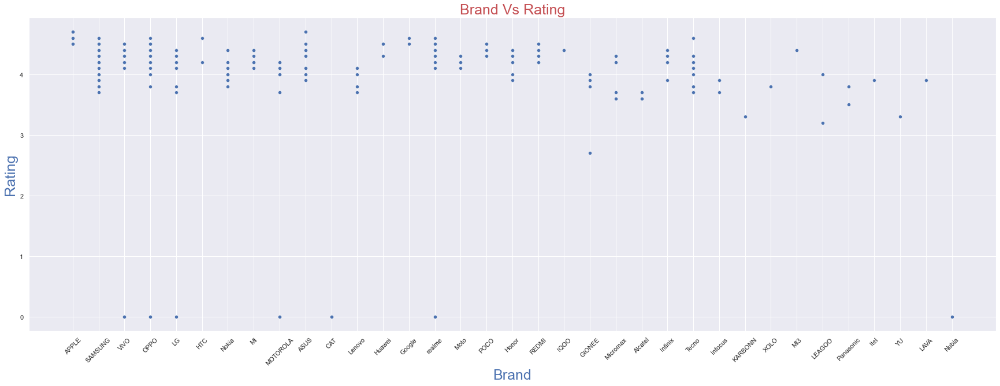

In [81]:
plt.rcParams['figure.figsize']=(30,10)
sns.scatterplot(x ='Brand',y='Rating',data=Cleaned_df)
plt.title('Brand Vs Rating',size=25,color='r')
plt.xlabel('Brand',size=25,color='b')
plt.ylabel('Rating',size=25,color='b')
plt.xticks(rotation=45);



Observation:
1. Total Mobile phones of Brand APPLE ans ASUS has got maximum ratings
2. For some Mobiles rating are not given 



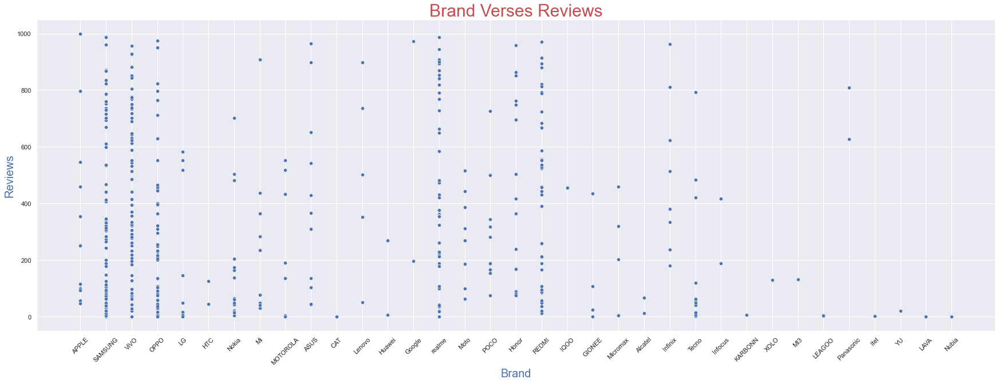

In [82]:
plt.rcParams['figure.figsize']=(30,10)
sns.scatterplot(x ='Brand',y='Reviews',data=Cleaned_df)


plt.title('Brand Verses Reviews',size=30,color='r')
plt.xlabel('Brand',size=20,color='b')
plt.ylabel('Reviews',size=20,color='b')
plt.xticks(rotation=45);



Observation:
1. Maximum number of Reviews Apple phones got


In [83]:
Cleaned_df.groupby('Brand')['Battery_mAh'].max()    # Samsung max 7000mAh


Brand
APPLE        4100.0
ASUS         6000.0
Alcatel      3000.0
CAT          4200.0
GIONEE       4010.0
Google       3140.0
HTC          4100.0
Honor        4100.0
Huawei       3340.0
IQOO         4440.0
Infinix      5200.0
Infocus      3000.0
Itel         3000.0
KARBONN      1800.0
LAVA         5000.0
LEAGOO       3000.0
LG           5000.0
Lenovo       4000.0
MI3          3050.0
MOTOROLA     6000.0
Mi           5000.0
Micromax     5000.0
Moto         5000.0
Nokia        4500.0
Nubia        3000.0
OPPO         5000.0
POCO         6000.0
Panasonic    4000.0
REDMI        6000.0
SAMSUNG      7000.0
Tecno        6000.0
ViVO         5000.0
XOLO         2000.0
YU           3930.0
realme       6000.0
Name: Battery_mAh, dtype: float64

In [84]:
Cleaned_df.groupby('Brand')['Battery_mAh'].min()    # Nokia min 1200mAh


Brand
APPLE        4100.0
ASUS         2650.0
Alcatel      2610.0
CAT          4000.0
GIONEE       2300.0
Google       3000.0
HTC          3000.0
Honor        3000.0
Huawei       3000.0
IQOO         4440.0
Infinix      4000.0
Infocus      3000.0
Itel         3000.0
KARBONN      1800.0
LAVA         5000.0
LEAGOO       2940.0
LG           2100.0
Lenovo       2300.0
MI3          3050.0
MOTOROLA     2510.0
Mi           3010.0
Micromax     2730.0
Moto         2300.0
Nokia        1200.0
Nubia        3000.0
OPPO         2420.0
POCO         4000.0
Panasonic    4000.0
REDMI        4000.0
SAMSUNG      2400.0
Tecno        3050.0
ViVO         2350.0
XOLO         2000.0
YU           3930.0
realme       3410.0
Name: Battery_mAh, dtype: float64

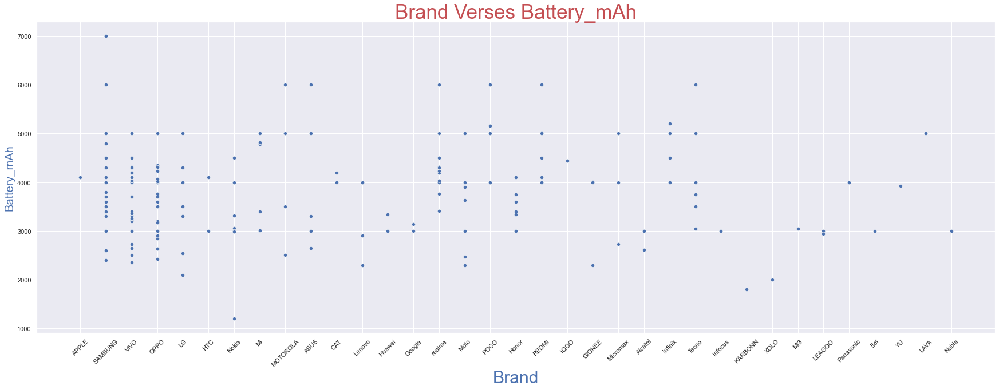

In [85]:
sns.scatterplot(x ='Brand',y='Battery_mAh',data=Cleaned_df)


plt.title('Brand Verses Battery_mAh',size=35,color='r')
plt.xlabel('Brand',size=30,color='b')
plt.ylabel('Battery_mAh',size=20,color='b')
plt.xticks(rotation=45);


Observation:
1. Brand Samsung is providing with highest 7000mAh
2. Brand Nokia is providing with lowest battery 1200mAh

In [86]:
Cleaned_df.groupby('Brand')['RAM'].min()     # xolo and karbonn 1GB

Brand
APPLE        0.0
ASUS         2.0
Alcatel      3.0
CAT          2.0
GIONEE       2.0
Google       4.0
HTC          4.0
Honor        3.0
Huawei       3.0
IQOO         8.0
Infinix      3.0
Infocus      3.0
Itel         3.0
KARBONN      1.0
LAVA         6.0
LEAGOO       2.0
LG           1.0
Lenovo       2.0
MI3          2.0
MOTOROLA     4.0
Mi           4.0
Micromax     3.0
Moto         2.0
Nokia        0.0
Nubia        2.0
OPPO         1.0
POCO         4.0
Panasonic    3.0
REDMI        3.0
SAMSUNG      2.0
Tecno        2.0
ViVO         2.0
XOLO         1.0
YU           4.0
realme       3.0
Name: RAM, dtype: float64

In [87]:
Cleaned_df.groupby('Brand')['RAM'].max()     #ASUS ,SAMSUNG,Vivo,realme 12GB

Brand
APPLE         0.0
ASUS         12.0
Alcatel       3.0
CAT           3.0
GIONEE        6.0
Google        6.0
HTC           6.0
Honor         6.0
Huawei        4.0
IQOO          8.0
Infinix       8.0
Infocus       4.0
Itel          3.0
KARBONN       1.0
LAVA          6.0
LEAGOO        3.0
LG            8.0
Lenovo        8.0
MI3           2.0
MOTOROLA      6.0
Mi            8.0
Micromax      6.0
Moto          6.0
Nokia         6.0
Nubia         2.0
OPPO          8.0
POCO          8.0
Panasonic     3.0
REDMI         8.0
SAMSUNG      12.0
Tecno         6.0
ViVO         12.0
XOLO          1.0
YU            4.0
realme       12.0
Name: RAM, dtype: float64

In [91]:
a=pd.crosstab(Cleaned_df.Brand,Cleaned_df.Front_Camera)
px.bar(a)

In [88]:
a=pd.crosstab(Cleaned_df.Brand,Cleaned_df.RAM)
px.bar(a)

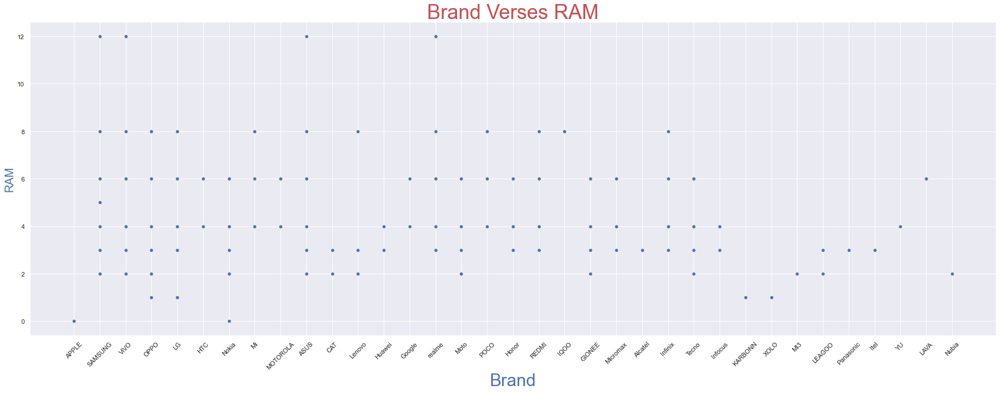

In [85]:
sns.scatterplot(x ='Brand',y='RAM',data=Cleaned_df)
plt.title('Brand Verses RAM',size=35,color='r')
plt.xlabel('Brand',size=30,color='b')
plt.ylabel('RAM',size=20,color='b')
plt.xticks(rotation=45);




Observation:
1. Samsung ,Vivo,Asus,Realme providing 12GB RAM
2. xolo and karbonn 1GB
`

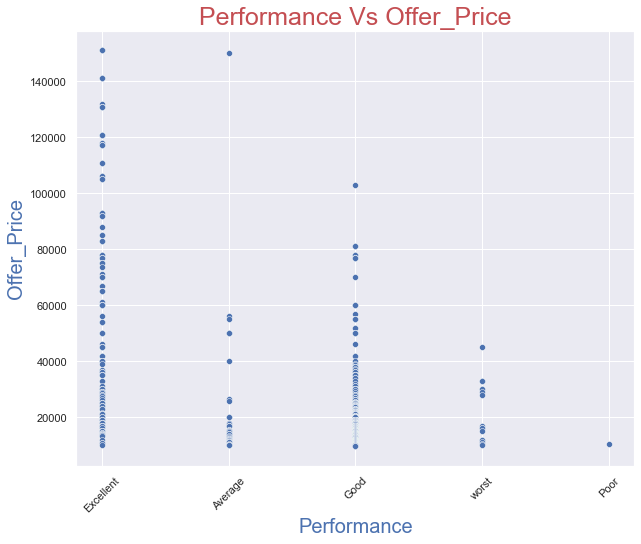

In [56]:
sns.set(rc={"figure.figsize" : (10,8)})
sns.scatterplot(x ='Performance',y='Offer_Price',data=Cleaned_df)
plt.title('Performance Vs Offer_Price',size=25,color='r')
plt.xlabel('Performance',size=20,color='b')
plt.ylabel('Offer_Price',size=20,color='b')
plt.xticks(rotation=45);



Observation:
1. Price below 20k till 1.5L mobiles got Excellent Performance based on the star rating
2. Price below 20k till around 60k mobiles got average Perforamnce
3. Price below 20k till around 1.1L mobiles got Good Performance
4. Price below 20k till around 50k mobiles got worst Performance
5. Price below 20k one of mobile got Poor rating

### Catergorial-Catergorial

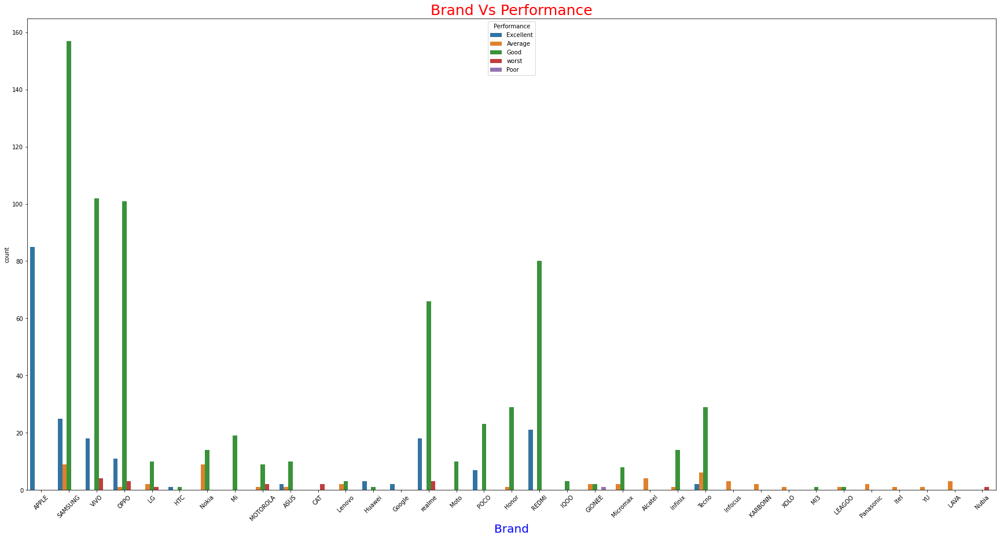

In [89]:
plt.figure(figsize=(30,15))
sns.countplot(data=Cleaned_df,x='Brand',hue='Performance')
plt.title('Brand Vs Performance',size=25,color='r')
plt.xlabel('Brand',size=20,color='b')

plt.xticks(rotation=45);

In [37]:
px.bar(Cleaned_df,x='Brand',color='Performance',title='Brand Vs Performance')

Observation:
1. Apple Brand depending on rating has got Excellent Performance
2. Samsung Brand got More Good then excellent and Average also
3. HTC brand got good

#### Multivariant

In [89]:
Cleaned_df.corr()

,Sr No.,MRP,Offer_Percentage,Offer_Price,Rating,Reviews,RAM,Screen_cm,Screen_inch,Front_Camera,Primary_Camera,Secondary_Camera,Battery_mAh
Sr No.,1.000000,-0.723317,0.028114,-0.724512,-0.130652,0.103756,-0.217690,-0.029100,-0.029366,-0.331038,-0.501755,-0.360745,0.140371
MRP,-0.723317,1.000000,0.096304,0.982452,0.138258,-0.169249,-0.068021,0.070378,0.070566,0.104138,0.473765,0.487138,-0.060133
Offer_Percentage,0.028114,0.096304,1.000000,-0.040730,-0.032541,0.157031,0.223794,0.331239,0.330932,0.172922,0.131095,0.238181,0.479156
Offer_Price,-0.724512,0.982452,-0.040730,1.000000,0.147763,-0.186907,-0.103311,0.040542,0.040757,0.085722,0.473142,0.457241,-0.099870
Rating,-0.130652,0.138258,-0.032541,0.147763,1.000000,0.198207,-0.046592,0.073974,0.074032,0.037626,0.124437,0.085968,0.045312
Reviews,0.103756,-0.169249,0.157031,-0.186907,0.198207,1.000000,-0.108951,-0.074809,-0.074783,0.075508,-0.033108,-0.122502,0.054586
RAM,-0.217690,-0.068021,0.223794,-0.103311,-0.046592,-0.108951,1.000000,0.550726,0.550552,0.411485,0.343483,0.320710,0.305287
Screen_cm,-0.029100,0.070378,0.331239,0.040542,0.073974,-0.074809,0.550726,1.000000,0.999998,0.323019,0.331028,0.385613,0.670962
Screen_inch,-0.029366,0.070566,0.330932,0.040757,0.074032,-0.074783,0.550552,0.999998,1.000000,0.322995,0.331103,0.385600,0.670643
Front_Camera,-0.331038,0.104138,0.172922,0.085722,0.037626,0.075508,0.411485,0.323019,0.322995,1.000000,0.451526,0.376160,0.182623


#### Pair Plot

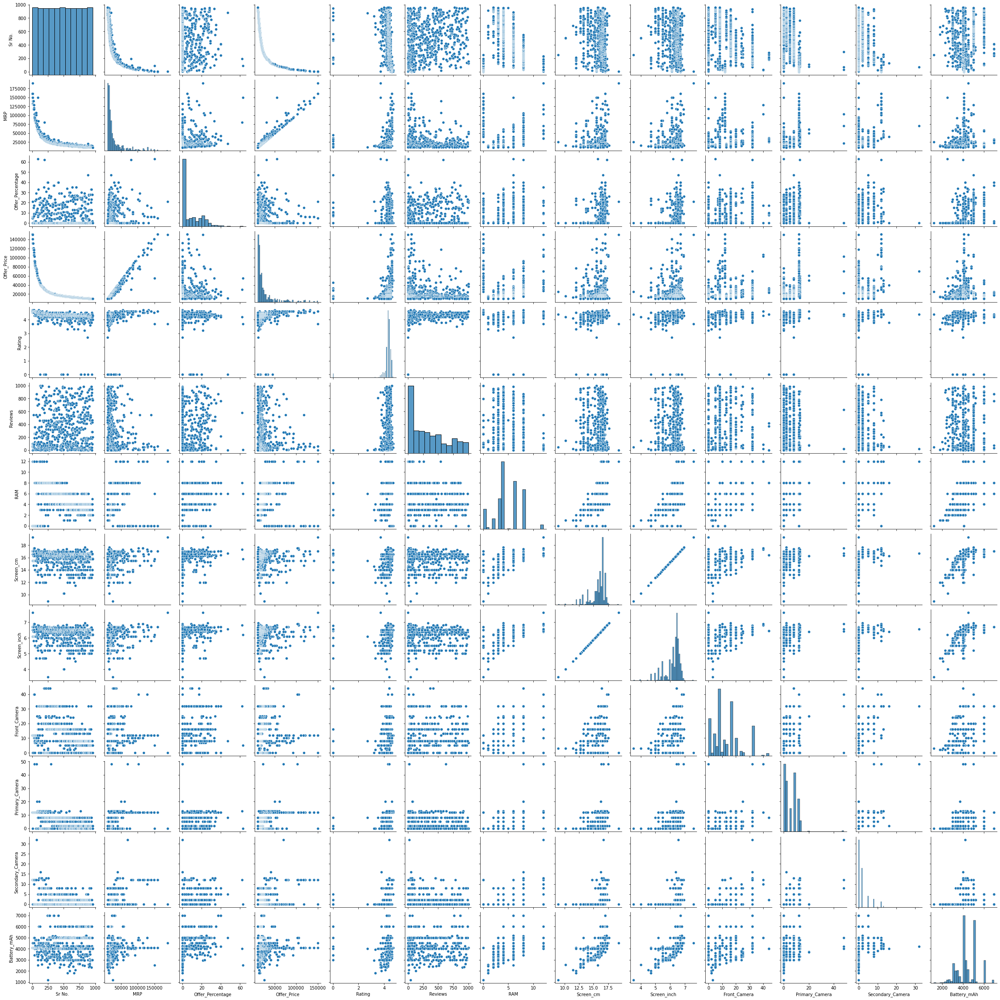

In [50]:
sns.pairplot(Cleaned_df);

### Heat Map

In [43]:
corr = Cleaned_df.corr()
corr.style.background_gradient(cmap ='coolwarm')

,Sr No.,MRP,Offer_Percentage,Offer_Price,Rating,Reviews,RAM,Screen_cm,Screen_inch,Front_Camera,Primary_Camera,Secondary_Camera,Battery_mAh
Sr No.,1.000000,-0.723317,0.028114,-0.724512,-0.130652,0.103756,-0.217690,-0.029100,-0.029366,-0.331038,-0.501755,-0.360745,0.140371
MRP,-0.723317,1.000000,0.096304,0.982452,0.138258,-0.169249,-0.068021,0.070378,0.070566,0.104138,0.473765,0.487138,-0.060133
Offer_Percentage,0.028114,0.096304,1.000000,-0.040730,-0.032541,0.157031,0.223794,0.331239,0.330932,0.172922,0.131095,0.238181,0.479156
Offer_Price,-0.724512,0.982452,-0.040730,1.000000,0.147763,-0.186907,-0.103311,0.040542,0.040757,0.085722,0.473142,0.457241,-0.099870
Rating,-0.130652,0.138258,-0.032541,0.147763,1.000000,0.198207,-0.046592,0.073974,0.074032,0.037626,0.124437,0.085968,0.045312
Reviews,0.103756,-0.169249,0.157031,-0.186907,0.198207,1.000000,-0.108951,-0.074809,-0.074783,0.075508,-0.033108,-0.122502,0.054586
RAM,-0.217690,-0.068021,0.223794,-0.103311,-0.046592,-0.108951,1.000000,0.550726,0.550552,0.411485,0.343483,0.320710,0.305287
Screen_cm,-0.029100,0.070378,0.331239,0.040542,0.073974,-0.074809,0.550726,1.000000,0.999998,0.323019,0.331028,0.385613,0.670962
Screen_inch,-0.029366,0.070566,0.330932,0.040757,0.074032,-0.074783,0.550552,0.999998,1.000000,0.322995,0.331103,0.385600,0.670643
Front_Camera,-0.331038,0.104138,0.172922,0.085722,0.037626,0.075508,0.411485,0.323019,0.322995,1.000000,0.451526,0.376160,0.182623


<AxesSubplot:>

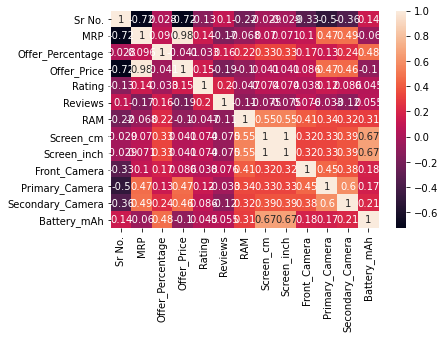

In [44]:

sns.heatmap(corr, annot = True)

## Price Range of mobiles phones

### Low Range

In [45]:
p1 = Cleaned_df[Cleaned_df.Offer_Price<= 15000.0]
px.scatter(p1,x='Brand',y = 'Offer_Price',title='Low range mobiles less than 15k')

Observation:
1. Brand Nokia and Vivo is Providing lowest price Mobile of range around 10000 Rs
2. Brand OPPO,REDMI,REALME,MI,SAMSUNG,ASUS,INFINIX,MOTOROLA,MOTO,TECNO,VIVO,KARBONN having price of 15k Rs

### Mediun Range

In [46]:
ab1 = Cleaned_df[(Cleaned_df.Offer_Price >= 15001.0) & (Cleaned_df.Offer_Price <= 25000.0)]
px.scatter(ab1,x='Brand',y = 'Offer_Price',title='Medium Range Mobiles Between 15k to 25k')

Observation:
1. Brand Realme,Poco,Redmi,Moto,Nokia,Vivo OPPO,IQOO have price of 25k Rs
2. Asus mobile Price is 23000 Rs
3. Huwai mobile price 22k Rs
4. Gionee Mobile Price of 21499 Rs
5. Brand of LG,Honor and micromax Price of20000 Rs
6. Motorola Brand Price is of 17999Rs
7. Lenova Brand Price of17499 Rs
8. Alcatel,Infinix and techno mobile price of 16999 Rs

### Flagship Mobile Price Range(25k to 40k)

In [48]:

px.scatter(ab1,x='Brand',y = 'Offer_Price',title='Flagship Mobiles Price range between 25k to 40k ')
ab1 = Cleaned_df[(Cleaned_df.Offer_Price >= 25001.0) & (Cleaned_df.Offer_Price <= 40000.0)]

Observation:
1. Realme,POCO,REDMI,MOTO,NOKIA,VIVO,OPPO,IQOO price of 25k Rs
2. Maximum Price of Brand of Alcatel,Infinix,Tecno 16990 Rs

### Flagship Killer Mobiles

In [43]:
p1 = Cleaned_df[Cleaned_df.Offer_Price>40000.0]

px.scatter(p1,x='Brand',y = 'Offer_Price',title='Flagship Killer Mobiles with Mobile price greater than 40k')

Observation:
1. Brand Apple having maximum Price of 150900 Rs
2. Brand Samsung having maximum Price of 149999 Rs
3. Brand Vivo having maximum Price of 69990 Rs
4. Brand OPPO having maximum Price of 60990 Rs
5. Brand LG having maximum Price of 60000 Rs
6. Brand HTC having Maximum Price of 56690 Rs
7. Brand Nokia having Maximum Price of 56299 Rs
8. Brand MI having Maximum Price of 54990 Rs
9. Brand Motorola having Maximum Price of 54990 Rs
10. Brand ASUS having Maximum Price of 49999 Rs
11. Brand CAT having Maximum Price of 44900 Rs

In [44]:


pr=Cleaned_df[(Cleaned_df.Offer_Price <= 15000.0) & (Cleaned_df.Rating >= 4.0)]
px.scatter(pr,x='Brand',y = 'Offer_Price',title='Brand Vs Price less than Rs. 15K (Rating greater than 4.0)')

Observation:
1. Brand Oppo mobile price range from 9.94k to 15k are avaiable with ratings greater than 4
2. Brand Redmi mobile price range from 9.969k to 15k are avaiable with ratings greater than 4
3. Brand Relme mobile price range from 9.999k to 15k are avaiable with ratings greater than 4
4. Brand Mi mobile price  15k are avaiable with ratings greater than 4
5. Brand Samsung mobile price range from 9.84k to 15k are avaiable with ratings greater than 4
6. Brand Infinix mobile price range from 9.99k to 15k are avaiable with ratings greater than 4
7. Brand Motorola mobile price range from 11k to 15k are avaiable with ratings greater than 4
8. Brand Moto mobile price range from 9.99k to 15k are avaiable with ratings greater than 4
9. Brand Asus mobile price range from 9.99k to 15k are avaiable with ratings greater than 4
10. Brand tecno mobile price range from 9.99k to 15k are avaiable with ratings greater than 4
11. Brand Vivo mobile price range from 9.89k to 12k are avaiable with ratings greater than 4
12. Brand Honor mobile price range from 10.99k to 12k are avaiable with ratings greater than 4
13. Brand Poco mobile price range from 9.99k to 15k are avaiable with ratings greater than 4
14. Brand MI3 mobile price range 13.99k are avaiable with ratings greater than 4
15. Brand Leagoo mobile price range 13.99k avaiable with ratings greater than 4
16. Brand LG mobile price range from 10.99k to 15k are avaiable with ratings greater than 4
17. Brand Nokia mobile price range from 9.79k to 12.50k are avaiable with ratings greater than 4
18. Brand Micromax mobile price range from 9.99k to 15k are avaiable with ratings greater than 4
19. Brand Lenovo mobile price range from 9.99k to 11.49k are avaiable with ratings greater than 4

In [45]:
pr=Cleaned_df[(Cleaned_df.Offer_Price <= 25000.0) & (Cleaned_df.Rating >= 4.0)]
px.scatter(pr,x='Brand',y = 'Offer_Price',title='Brand Vs Price less than Rs. 25K (Rating greater than 4.0)')

Observation:
1. Brand Realme Mobiles from Price range of 10k to 25k are avaiable with ratings greater than 4 
2. Brand Poco Mobiles from Price range of 10.499k to 25k are avaiable with ratings greater than 4 
3. Brand Redmi Mobiles from Price range of 9.969k to 25k are avaiable with ratings greater than 4 
4. Brand Moto Mobiles from Price range of 10.999k to 25k are avaiable with ratings greater than 4 
5. Brand Nokia Mobiles from Price range of 9.799k to 25k are avaiable with ratings greater than 4 
6. Brand Vivo Mobiles from Price range of 9.811k to 25k are avaiable with ratings greater than 4 
7. Brand Oppo Mobiles from Price range of 9.940k to 25k are avaiable with ratings greater than 4 
8. Brand IQOO Mobiles from Price range of 14.999k to 24.590k are avaiable with ratings greater than 4 
9. Brand Mi Mobiles from Price range of 14.999k to 25k are avaiable with ratings greater than 4 
10. Brand Samsung Mobiles from Price range of 9.84k to 24.490k are avaiable with ratings greater than 4 
11. Brand Asus Mobiles from Price range of 12.999k to 17.990k are avaliable with ratings greater than 4
12. Brand Huawai Mobiles from Price range of 21.999k  with ratings greater than 4 
13. Brand Gionee Mobiles from Price range of 21.499k  with ratings greater than 4
14. Brand Honor Mobiles from Price range of 10.499k to 19.999k are avaiable with ratings greater than 4 
15. Brand Motorola Mobiles from Price range of 10.999k to 17.990k are avaiable with ratings greater than 4
16. Brand Tecno Mobiles from Price range of 9.999k to 16.99k are avaiable with ratings greater than 4
17. Brand LG Mobiles from Price range of 10.85k to 15.32k are avaiable with ratings greater than 4
18. Brand Infinix Mobiles from Price range of 9.999k to 14.99k  are avaiable with ratings greater than 4
19. Brand MI3 Mobiles from Price range of 13.99k avaiable with ratings greater than 4
20. Brand Leagoo Mobiles from Price range of 13.99k avaiable with ratings greater than 4
21. Brand Micromax Mobiles from Price range of 9.999k to 12.499k are avaiable with ratings greater than 4
22. Brand Lenevo Mobiles from Price range of  9.999k to 11.499k are avaiable with ratings greater than 4

In [23]:
pr=Cleaned_df[(Cleaned_df.Offer_Price >= 25000.0) & (Cleaned_df.Rating >= 4.5)]
px.scatter(pr,x='Brand',y = 'Offer_Price',title='Brand Vs Price Greater than Rs. 25K (Rating greater than 4.5)')

Observation:
1. Brand Apple Mobiles from Price range of 29.999k to 150.9k are avaiable with ratings greater than 4.5
2. Brand Samsung Mobiles from Price range of 38.999k to 117.99k are avaiable with ratings greater than 4.5
3. Brand Oppo Mobiles from Price range of 60.99k is avaiable with ratings greater than 4.5
4. Brand HTC Mobiles from Price range of 53.99k is avaiable with ratings greater than 4.5
5. Brand Asus Mobiles from Price range of 49.999k to 36.299k are avaiable with ratings greater than 4.5
6. Brand Vivo Mobiles from Price range of 27.99k to 49.99k are avaiable with ratings greater than 4.5
7. Brand Huwai Mobiles from Price range of 39.999k is avaiable with ratings greater than 4.5
8. Brand Goggle Mobiles from Price range of 26.999k to 39.999k are avaiable with ratings greater than 4.5
9. Brand realme Mobiles from Price range of 35.999k avaiable with ratings greater than 4.5
10. Brand Poco Mobiles from Price range of 29.999k to 30.999k are avaiable with ratings greater than 4.5
11. Brand Redmi Mobiles from Price range of 25.99k to 28.99k are avaiable with ratings greater than 4.5